In [14]:
%conda install -c bioconda statsmodels -y

Channels:
 - bioconda
 - defaults
 - conda-forge
Platform: linux-64
Solving environment: done


==> WARNING: A newer version of conda exists. <==
    current version: 25.5.1
    latest version: 25.7.0

Please update conda by running

    $ conda update -n base -c conda-forge conda



## Package Plan ##

  environment location: /home/vicky/miniconda3/envs/bioinfo_python

  added / updated specs:
    - statsmodels


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    patsy-1.0.1                |  py311h06a4308_0         365 KB
    statsmodels-0.14.5         |  py311h76ea63d_0        12.3 MB
    ------------------------------------------------------------
                                           Total:        12.7 MB

The following NEW packages will be INSTALLED:

  patsy              pkgs/main/linux-64::patsy-1.0.1-py311h06a4308_0 
  statsmodels        pkgs/main/linux-64::statsmodels-0.14.5-

In [1]:
import pandas as pd
import GEOparse
import numpy as np
import os

In [6]:
# Create directories
os.makedirs("data/raw", exist_ok=True)

print("Downloading GSE286114 from GEO...")

# Download the dataset
gse = GEOparse.get_GEO(geo="GSE286114", destdir="data/raw")

print(f"Dataset downloaded: {len(gse.gsms)} samples")

# Extract sample metadata
metadata_list = []
for gsm_name, gsm in gse.gsms.items():
    metadata_list.append({
        'sample_id': gsm_name,
        'title': gsm.metadata.get('title', [''])[0],
        'source': gsm.metadata.get('source_name_ch1', [''])[0],
        'organism': gsm.metadata.get('organism_ch1', [''])[0],
        'treatment': gsm.metadata.get('treatment_protocol_ch1', [''])[0] if 'treatment_protocol_ch1' in gsm.metadata else 'Not specified'
    })

metadata = pd.DataFrame(metadata_list)
print("\n📋 Sample information:")
print(metadata)

# Save metadata
metadata.to_csv("data/raw/metadata.csv", index=False)
print("Metadata saved: data/raw/metadata.csv")

# Download expression data 
import urllib.request
supp_url = "https://ftp.ncbi.nlm.nih.gov/geo/series/GSE286nnn/GSE286114/suppl/GSE286114_gene_fpkm_RmpA_Escherichia.xls.gz"
urllib.request.urlretrieve(supp_url, "data/raw/GSE286114_gene_fpkm_RmpA_Escherichia.xls.gz")

print("Download complete!")


09-Aug-2025 18:01:10 DEBUG utils - Directory data/raw already exists. Skipping.
09-Aug-2025 18:01:10 INFO GEOparse - Downloading ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE286nnn/GSE286114/soft/GSE286114_family.soft.gz to data/raw/GSE286114_family.soft.gz


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 3.46k/3.46k [00:00<00:00, 4.46kB/s]
09-Aug-2025 18:01:12 DEBUG downloader - Size validation passed
09-Aug-2025 18:01:12 DEBUG downloader - Moving /tmp/tmpj7j9zclj to /home/vicky/python_transcriptomics_analysis/data/raw/GSE286114_family.soft.gz
09-Aug-2025 18:01:12 DEBUG downloader - Successfully downloaded ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE286nnn/GSE286114/soft/GSE286114_family.soft.gz
09-Aug-2025 18:01:12 INFO GEOparse - Parsing data/raw/GSE286114_family.soft.gz: 
09-Aug-2025 18:01:12 DEBUG GEOparse - DATABASE: GeoMiame
09-Aug-2025 18:01:12 DEBUG GEOparse - SERIES: GSE286114
09-Aug-2025 18:01:12 DEBUG GEOparse - PLATFORM: GPL21433
09-Aug-2025 18:01:12 DEBUG GEOparse - PLATFORM: GPL35274
09-Aug-2025 18:01:12 DEBUG GEOparse - SAMPLE: GSM8717920
09-Aug-2025 18:01:12 DEBUG GEOparse - SAMPLE: GSM8717921
09-Aug-2025 18:01:12 DEBUG GEOparse - SAMPLE: GSM8717922
09-Aug-2025 18:

Dataset downloaded: 12 samples

📋 Sample information:
     sample_id                                              title  \
0   GSM8717920    Control sample 1 of Klebsiella pneumonia RJF293   
1   GSM8717921    Control sample 2 of Klebsiella pneumonia RJF293   
2   GSM8717922    Control sample 3 of Klebsiella pneumonia RJF293   
3   GSM8717923  rmpA knochdown sample 1 of Klebsiella pneumoni...   
4   GSM8717924  rmpA knochdown sample 2 of Klebsiella pneumoni...   
5   GSM8717925  rmpA knochdown sample 3 of Klebsiella pneumoni...   
6   GSM8717926               Control sample 1 of Escherichia coli   
7   GSM8717927               Control sample 2 of Escherichia coli   
8   GSM8717928               Control sample 3 of Escherichia coli   
9   GSM8717929   rmpA overexpression sample 1 of Escherichia coli   
10  GSM8717930   rmpA overexpression sample 2 of Escherichia coli   
11  GSM8717931   rmpA overexpression sample 3 of Escherichia coli   

                                               s

In [7]:
import pandas as pd
import gzip
import xlrd

# Direct approach - read your known file format
with gzip.open("data/raw/GSE286114_gene_fpkm_RmpA_Escherichia.xls.gz", 'rb') as f:
    counts = pd.read_excel(f, index_col=0)

print(f"Data loaded: {counts.shape}")
counts.head()

✅ Data loaded: (5013, 15)


,PLB1K-rmpA1,PLB1K-rmpA2,PLB1K-rmpA3,PLB1K1,PLB1K2,PLB1K3,gene_name,gene_chr,gene_start,gene_end,gene_strand,gene_length,gene_biotype,gene_description,tf_family
gene_id,,,,,,,,,,,,,,,
b2621,75815.318312,100726.451285,174636.181511,386339.446898,255947.316064,266205.512375,ssrA,NC_000913.3,2755593,2755955,+,363,protein_coding,tmRNA&&-- && -,-
b3123,82506.512231,101456.140657,160679.776623,295344.019321,225058.080349,241502.350920,rnpB,NC_000913.3,3270216,3270592,-,377,protein_coding,RNase P catalytic RNA component&&-- && -,-
b3708,10411.095481,22095.215599,50262.110216,32753.276037,25459.581021,26817.617368,tnaA,NC_000913.3,3888730,3890145,+,1416,protein_coding,tryptophanase&&sp|A7ZTR3|TNAA_ECO24 Tryptophan...,Beta_elim_lyase
b2215,14408.030061,18414.197491,17590.693024,22170.466386,25727.184048,29026.344209,ompC,NC_000913.3,2311646,2312749,-,1104,protein_coding,outer membrane porin C&&sp|P06996|OMPC_ECOLI O...,Porin_1
b1901,7580.068876,19927.277455,24719.592862,26158.810814,23867.381910,22835.166777,araF,NC_000913.3,1985139,1986128,-,990,protein_coding,arabinose ABC transporter periplasmic binding ...,Peripla_BP_1


[2025-08-09 18:56:46] Starting RNA-seq data preprocessing
[2025-08-09 18:56:46] Loading GSE286114 data
[2025-08-09 18:56:46] Successfully loaded data: (5013, 16)
📊 Raw data preview:
  gene_id   PLB1K-rmpA1    PLB1K-rmpA2    PLB1K-rmpA3         PLB1K1  \
0   b2621  75815.318312  100726.451285  174636.181511  386339.446898   
1   b3123  82506.512231  101456.140657  160679.776623  295344.019321   
2   b3708  10411.095481   22095.215599   50262.110216   32753.276037   
3   b2215  14408.030061   18414.197491   17590.693024   22170.466386   
4   b1901   7580.068876   19927.277455   24719.592862   26158.810814   

          PLB1K2         PLB1K3 gene_name     gene_chr  gene_start  gene_end  \
0  255947.316064  266205.512375      ssrA  NC_000913.3     2755593   2755955   
1  225058.080349  241502.350920      rnpB  NC_000913.3     3270216   3270592   
2   25459.581021   26817.617368      tnaA  NC_000913.3     3888730   3890145   
3   25727.184048   29026.344209      ompC  NC_000913.3     231164

/tmp/ipykernel_15078/3501532030.py:113: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0,1].boxplot([sample_data[col] for col in sample_data.columns],
/tmp/ipykernel_15078/3501532030.py:150: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1,1].boxplot([sample_data_filtered[col] for col in sample_data_filtered.columns],


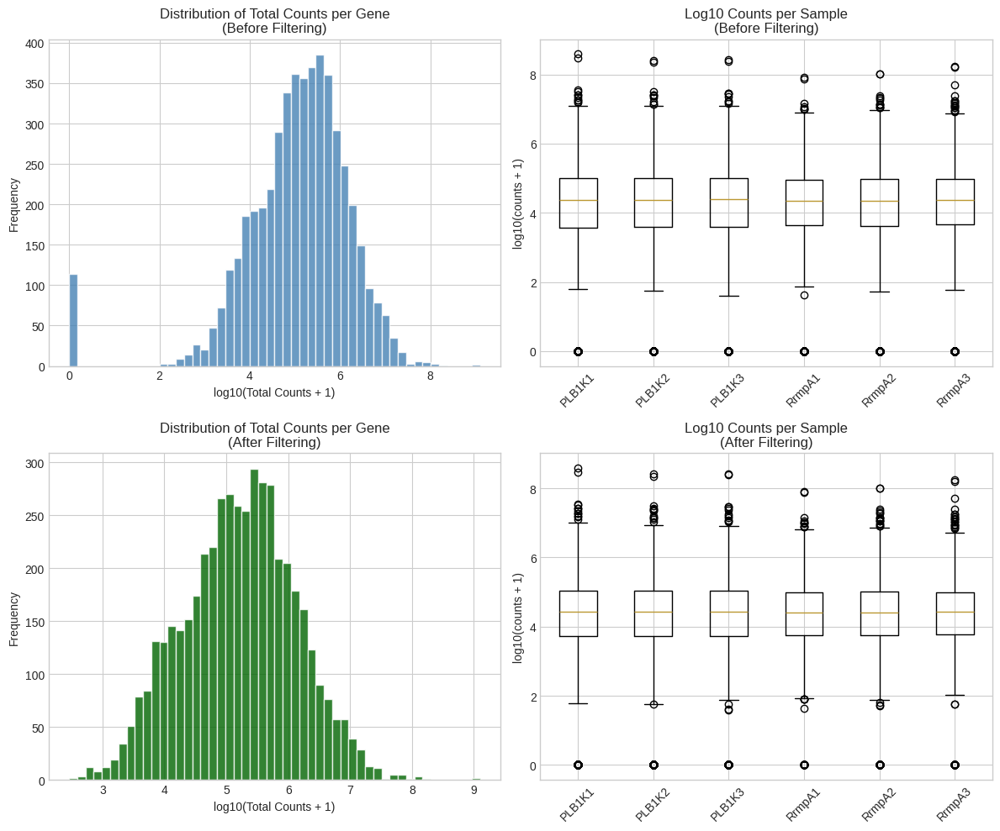

[2025-08-09 18:56:49] Generated count distribution plots
[2025-08-09 18:56:49] Normalizing count data
📊 Size factors: {'PLB1K1': 1.278, 'PLB1K2': 1.088, 'PLB1K3': 1.077, 'PLB1K-rmpA1': 0.766, 'PLB1K-rmpA2': 0.847, 'PLB1K-rmpA3': 0.943}


/home/vicky/miniconda3/envs/bioinfo_python/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_15078/3501532030.py:178: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot([np.log2(counts_filtered[col]) for col in counts_filtered.columns],
/home/vicky/miniconda3/envs/bioinfo_python/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_15078/3501532030.py:185: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot([np.log2(normalized_counts[col]) for col in normalized_counts.colu

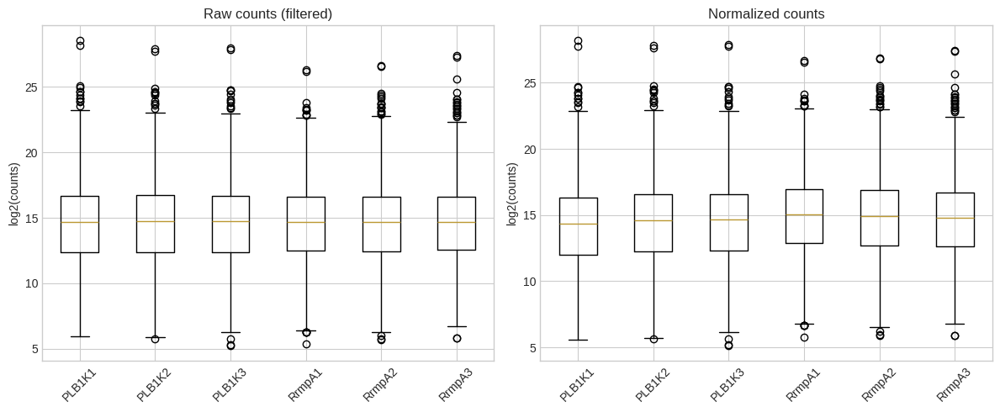

[2025-08-09 18:56:50] Generated normalization effect plots
[2025-08-09 18:56:50] Saved filtering statistics

📊 PREPROCESSING SUMMARY
   Original genes: 5,013
   Genes after filtering: 4,781
   Percentage filtered: 4.6%
   Samples analyzed: 6
   Normalization method: Size factor normalization
   Min count threshold: 10
   Min samples threshold: 3

📁 Files created:
   - data/processed/sample_metadata.csv
   - data/processed/gene_info.csv
   - data/processed/normalized_counts.csv
   - data/processed/counts_filtered.csv
   - results/figures/qc/count_distributions.png
   - results/figures/qc/normalization_effect.png
   - results/tables/filtering_statistics.csv
[2025-08-09 18:56:50] Preprocessing complete!

🎉 Ready for differential expression analysis!
📊 Normalized data shape: (4781, 6)
📋 Conditions: ['control' 'rmpA_overexpression']


In [1]:
# RNA-seq Preprocessing Pipeline - Python Implementation
# Equivalent to your R workflow but simpler!

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import datetime

# Set up plotting style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

# Create output directories
os.makedirs("data/processed", exist_ok=True)
os.makedirs("results/figures/qc", exist_ok=True)
os.makedirs("results/tables", exist_ok=True)

def log_message(message):
    """Simple logging function like your R version"""
    timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    print(f"[{timestamp}] {message}")

log_message("Starting RNA-seq data preprocessing")

# ==========================================
# 1. DATA LOADING
# ==========================================

log_message("Loading GSE286114 data")

try:
    # Try loading the downloaded file
    import gzip
    with gzip.open("data/raw/GSE286114_gene_fpkm_RmpA_Escherichia.xls.gz", 'rb') as f:
        counts_data = pd.read_excel(f)
    log_message(f"Successfully loaded data: {counts_data.shape}")
except:
    # Alternative: if file is already extracted
    counts_data = pd.read_excel("data/raw/counts_data.xls")
    log_message(f"Successfully loaded data: {counts_data.shape}")

print("📊 Raw data preview:")
print(counts_data.head())
print("\n📋 Columns:", list(counts_data.columns))

# ==========================================
# 2. DATA PREPARATION - Same as your R code
# ==========================================

log_message("Preparing expression data")

# Extract expression data (equivalent to your R select() and column_to_rownames())
expression_data = counts_data.set_index('gene_id')[['PLB1K1', 'PLB1K2', 'PLB1K3', 
                                                    'PLB1K-rmpA1', 'PLB1K-rmpA2', 'PLB1K-rmpA3']]

# Convert to numeric (equivalent to your R mutate(across(-gene_id, as.numeric)))
expression_data = expression_data.apply(pd.to_numeric, errors='coerce')

print(f"✅ Expression matrix: {expression_data.shape}")
print("📋 Samples:", list(expression_data.columns))

# Create sample metadata (exactly like your R version)
sample_metadata = pd.DataFrame({
    'sample_id': ['PLB1K1', 'PLB1K2', 'PLB1K3', 'PLB1K-rmpA1', 'PLB1K-rmpA2', 'PLB1K-rmpA3'],
    'condition': ['control'] * 3 + ['rmpA_overexpression'] * 3,
    'replicate': [1, 2, 3, 1, 2, 3],
    'batch': ['batch1'] * 6
})

print("\n📋 Sample metadata:")
print(sample_metadata)

# Save sample metadata
sample_metadata.to_csv("data/processed/sample_metadata.csv", index=False)
log_message("Saved sample metadata")

# Save gene information 
gene_info = counts_data[['gene_id', 'gene_name', 'gene_chr', 'gene_start', 'gene_end', 
                        'gene_strand', 'gene_length', 'gene_biotype', 'gene_description']]
gene_info.to_csv("data/processed/gene_info.csv", index=False)
log_message("Saved gene annotation information")

# ==========================================
# 3. QUALITY CONTROL FILTERING - Same logic as R
# ==========================================

log_message("Creating count distribution plots before filtering")

# Convert FPKM to approximate counts (like your R version)
counts_matrix = (expression_data * 1000).round().astype(int)

# Count distribution before filtering
total_counts_per_gene = counts_matrix.sum(axis=1)
log_message(f"Count summary before filtering: "
           f"Min: {total_counts_per_gene.min()}, "
           f"Median: {total_counts_per_gene.median():.0f}, "
           f"Max: {total_counts_per_gene.max()}")

# Create count distribution plots (same as your R version)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Plot 1: Raw count distribution  
axes[0,0].hist(np.log10(total_counts_per_gene + 1), bins=50, 
               color='steelblue', edgecolor='white', alpha=0.8)
axes[0,0].set_title("Distribution of Total Counts per Gene\n(Before Filtering)")
axes[0,0].set_xlabel("log10(Total Counts + 1)")
axes[0,0].set_ylabel("Frequency")

# Plot 2: Sample counts boxplot
sample_data = np.log10(counts_matrix + 1)
axes[0,1].boxplot([sample_data[col] for col in sample_data.columns], 
                  labels=[col.replace('PLB1K-', 'R') for col in sample_data.columns])
axes[0,1].set_title("Log10 Counts per Sample\n(Before Filtering)")
axes[0,1].set_ylabel("log10(counts + 1)")
axes[0,1].tick_params(axis='x', rotation=45)

# Apply filtering (same criteria as your R version)
log_message("Applying count filtering")
min_count = 10
min_samples = 3

# Same logic as your R: keep genes with >= min_count in >= min_samples
keep_genes = (counts_matrix >= min_count).sum(axis=1) >= min_samples
counts_filtered = counts_matrix[keep_genes].copy()

# Log filtering results (same format as R)
total_genes = len(counts_matrix)
genes_kept = len(counts_filtered)
genes_removed = total_genes - genes_kept
percent_removed = (genes_removed / total_genes) * 100

log_message(f"Filtering results: "
           f"Total genes: {total_genes}, "
           f"Genes kept: {genes_kept}, "
           f"Genes filtered out: {genes_removed} "
           f"({percent_removed:.2f}%)")

# Plot filtered count distribution
total_counts_filtered = counts_filtered.sum(axis=1)
axes[1,0].hist(np.log10(total_counts_filtered + 1), bins=50,
               color='darkgreen', edgecolor='white', alpha=0.8)
axes[1,0].set_title("Distribution of Total Counts per Gene\n(After Filtering)")
axes[1,0].set_xlabel("log10(Total Counts + 1)")
axes[1,0].set_ylabel("Frequency")

# Plot filtered sample counts
sample_data_filtered = np.log10(counts_filtered + 1)
axes[1,1].boxplot([sample_data_filtered[col] for col in sample_data_filtered.columns],
                  labels=[col.replace('PLB1K-', 'R') for col in sample_data_filtered.columns])
axes[1,1].set_title("Log10 Counts per Sample\n(After Filtering)")
axes[1,1].set_ylabel("log10(counts + 1)")
axes[1,1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig("results/figures/qc/count_distributions.png", dpi=300, bbox_inches='tight')
plt.show()
log_message("Generated count distribution plots")

# ==========================================
# 4. NORMALIZATION - Same method as R
# ==========================================

log_message("Normalizing count data")

# Calculate size factors (simple approach)
size_factors = counts_filtered.sum() / counts_filtered.sum().mean()
print("📊 Size factors:", size_factors.round(3).to_dict())

# Normalize by size factors
normalized_counts = counts_filtered.div(size_factors, axis=1)

# Create normalization effect plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Raw counts boxplot
axes[0].boxplot([np.log2(counts_filtered[col]) for col in counts_filtered.columns],
                labels=[col.replace('PLB1K-', 'R') for col in counts_filtered.columns])
axes[0].set_title("Raw counts (filtered)")
axes[0].set_ylabel("log2(counts)")
axes[0].tick_params(axis='x', rotation=45)

# Normalized counts boxplot  
axes[1].boxplot([np.log2(normalized_counts[col]) for col in normalized_counts.columns],
                labels=[col.replace('PLB1K-', 'R') for col in normalized_counts.columns])
axes[1].set_title("Normalized counts")
axes[1].set_ylabel("log2(counts)")
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig("results/figures/qc/normalization_effect.png", dpi=300, bbox_inches='tight')
plt.show()
log_message("Generated normalization effect plots")

# ==========================================
# 5. SAVE PROCESSED DATA
# ==========================================

# Save all processed data
normalized_counts.to_csv("data/processed/normalized_counts.csv")
counts_filtered.to_csv("data/processed/counts_filtered.csv")

# Save filtering statistics (same format as R)
filtering_stats = pd.DataFrame([{
    'total_genes': total_genes,
    'genes_kept': genes_kept,
    'genes_filtered': genes_removed,
    'percentage_filtered': percent_removed
}])

filtering_stats.to_csv("results/tables/filtering_statistics.csv", index=False)
log_message("Saved filtering statistics")

# ==========================================
# 6. SUMMARY STATISTICS
# ==========================================

print("\n" + "="*60)
print("📊 PREPROCESSING SUMMARY")
print("="*60)

summary_stats = {
    'Original genes': f"{total_genes:,}",
    'Genes after filtering': f"{genes_kept:,}",
    'Percentage filtered': f"{percent_removed:.1f}%",
    'Samples analyzed': counts_filtered.shape[1],
    'Normalization method': 'Size factor normalization',
    'Min count threshold': min_count,
    'Min samples threshold': min_samples
}

for key, value in summary_stats.items():
    print(f"   {key}: {value}")

print(f"\n📁 Files created:")
print(f"   - data/processed/sample_metadata.csv")
print(f"   - data/processed/gene_info.csv") 
print(f"   - data/processed/normalized_counts.csv")
print(f"   - data/processed/counts_filtered.csv")
print(f"   - results/figures/qc/count_distributions.png")
print(f"   - results/figures/qc/normalization_effect.png")
print(f"   - results/tables/filtering_statistics.csv")

log_message("Preprocessing complete!")

print("\n🎉 Ready for differential expression analysis!")
print("📊 Normalized data shape:", normalized_counts.shape)
print("📋 Conditions:", sample_metadata['condition'].unique())

🎯 RECOMMENDED APPROACH: Direct FPKM Analysis
📊 FPKM data shape: (5013, 6)
📋 Value range: 0.00 to 386339.4

📋 Sample metadata:
     sample_id            condition  replicate
0       PLB1K1              control          1
1       PLB1K2              control          2
2       PLB1K3              control          3
3  PLB1K-rmpA1  rmpA_overexpression          1
4  PLB1K-rmpA2  rmpA_overexpression          2
5  PLB1K-rmpA3  rmpA_overexpression          3

🔧 Quality control filtering (FPKM-appropriate)...
   Original genes: 5,013
   Genes kept: 4,488
   Genes removed: 525 (10.5%)
   Criteria: FPKM ≥ 1.0 in ≥ 3 samples

🔄 Log2 transformation...
   Transformed data range: 0.00 to 18.56

📊 Creating quality control plots...


/tmp/ipykernel_15078/3780071245.py:103: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1,0].boxplot([fpkm_log2[col] for col in fpkm_log2.columns], labels=sample_names)


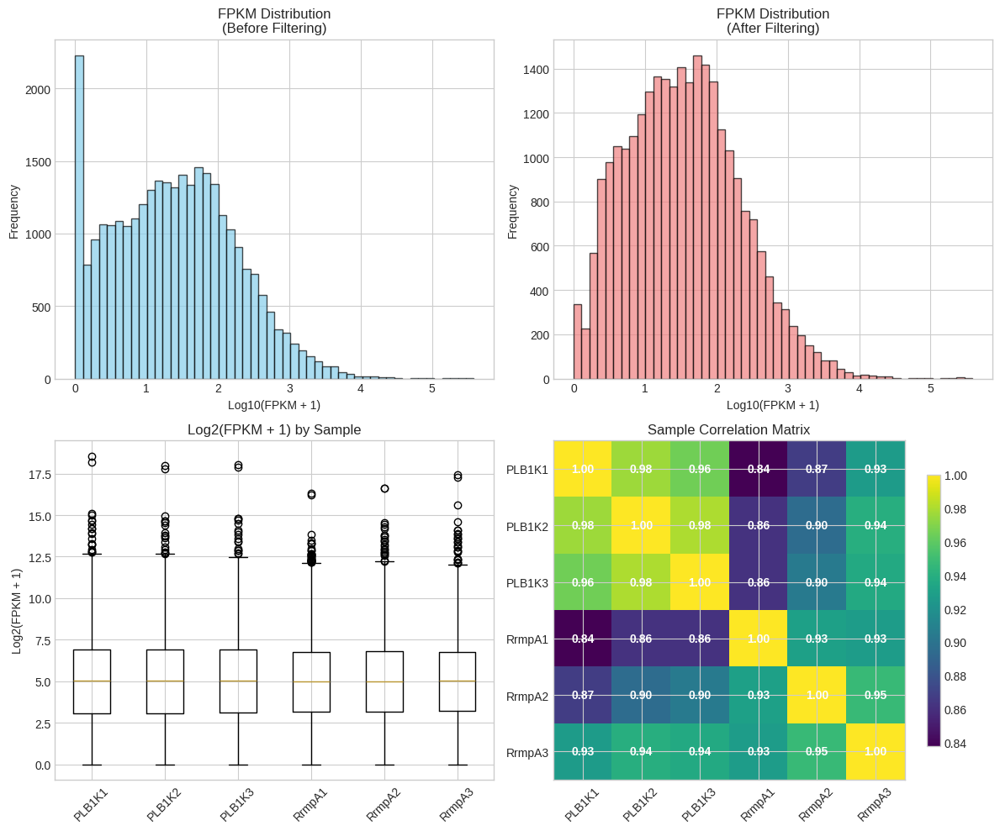


📈 Basic statistical analysis...
   Total genes analyzed: 4,488
   Significantly changed: 159 (3.5%)
   Upregulated: 44
   Downregulated: 115

💾 Files saved:
   - data/processed/fpkm_log2_normalized.csv
   - results/tables/differential_expression_fpkm.csv
   - results/tables/filtering_statistics_fpkm.csv
   - results/figures/qc/fpkm_quality_control.png

✅ RECOMMENDED PREPROCESSING COMPLETE!
📊 Ready for downstream analysis with proper FPKM methods


In [2]:
# RECOMMENDED: Direct FPKM Analysis Pipeline
# Based on best practices for FPKM data

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import os

# Load data
try:
    import gzip
    with gzip.open("data/raw/GSE286114_gene_fpkm_RmpA_Escherichia.xls.gz", 'rb') as f:
        data = pd.read_excel(f)
except:
    data = pd.read_excel("data/raw/counts_data.xls")

print("🎯 RECOMMENDED APPROACH: Direct FPKM Analysis")
print("="*50)

# ==========================================
# 1. EXTRACT FPKM DATA DIRECTLY
# ==========================================

# Extract FPKM values (don't convert to counts!)
fpkm_data = data.set_index('gene_id')[['PLB1K1', 'PLB1K2', 'PLB1K3', 
                                       'PLB1K-rmpA1', 'PLB1K-rmpA2', 'PLB1K-rmpA3']]

print(f"📊 FPKM data shape: {fpkm_data.shape}")
print(f"📋 Value range: {fpkm_data.min().min():.2f} to {fpkm_data.max().max():.1f}")

# Create metadata
metadata = pd.DataFrame({
    'sample_id': fpkm_data.columns,
    'condition': ['control'] * 3 + ['rmpA_overexpression'] * 3,
    'replicate': [1, 2, 3, 1, 2, 3]
})

print("\n📋 Sample metadata:")
print(metadata)

# ==========================================
# 2. FPKM-APPROPRIATE FILTERING
# ==========================================

print("\n🔧 Quality control filtering (FPKM-appropriate)...")

# FPKM filtering: genes with FPKM ≥ 1.0 in at least 3 samples
# This is more appropriate than count-based filtering
min_fpkm = 1.0
min_samples = 3

keep_genes = (fpkm_data >= min_fpkm).sum(axis=1) >= min_samples
fpkm_filtered = fpkm_data[keep_genes].copy()

# Filtering statistics
total_genes = len(fpkm_data)
genes_kept = len(fpkm_filtered)
genes_removed = total_genes - genes_kept
percent_removed = (genes_removed / total_genes) * 100

print(f"   Original genes: {total_genes:,}")
print(f"   Genes kept: {genes_kept:,}")
print(f"   Genes removed: {genes_removed:,} ({percent_removed:.1f}%)")
print(f"   Criteria: FPKM ≥ {min_fpkm} in ≥ {min_samples} samples")

# ==========================================
# 3. LOG2 TRANSFORMATION (STANDARD FOR FPKM)
# ==========================================

print("\n🔄 Log2 transformation...")

# Log2(FPKM + 1) transformation - standard for FPKM data
fpkm_log2 = np.log2(fpkm_filtered + 1)

print(f"   Transformed data range: {fpkm_log2.min().min():.2f} to {fpkm_log2.max().max():.2f}")

# ==========================================
# 4. QUALITY CONTROL PLOTS
# ==========================================

print("\n📊 Creating quality control plots...")

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Plot 1: FPKM distribution before filtering
axes[0,0].hist(np.log10(fpkm_data.values.flatten() + 1), bins=50, 
               color='skyblue', alpha=0.7, edgecolor='black')
axes[0,0].set_title("FPKM Distribution\n(Before Filtering)")
axes[0,0].set_xlabel("Log10(FPKM + 1)")
axes[0,0].set_ylabel("Frequency")

# Plot 2: FPKM distribution after filtering
axes[0,1].hist(np.log10(fpkm_filtered.values.flatten() + 1), bins=50,
               color='lightcoral', alpha=0.7, edgecolor='black')
axes[0,1].set_title("FPKM Distribution\n(After Filtering)")
axes[0,1].set_xlabel("Log10(FPKM + 1)")
axes[0,1].set_ylabel("Frequency")

# Plot 3: Sample boxplots (log2 transformed)
sample_names = [col.replace('PLB1K-', 'R') for col in fpkm_log2.columns]
axes[1,0].boxplot([fpkm_log2[col] for col in fpkm_log2.columns], labels=sample_names)
axes[1,0].set_title("Log2(FPKM + 1) by Sample")
axes[1,0].set_ylabel("Log2(FPKM + 1)")
axes[1,0].tick_params(axis='x', rotation=45)

# Plot 4: Sample correlation heatmap
correlation_matrix = fpkm_log2.corr()
im = axes[1,1].imshow(correlation_matrix, cmap='viridis', aspect='auto')
axes[1,1].set_title("Sample Correlation Matrix")
axes[1,1].set_xticks(range(len(sample_names)))
axes[1,1].set_yticks(range(len(sample_names)))
axes[1,1].set_xticklabels(sample_names, rotation=45)
axes[1,1].set_yticklabels(sample_names)

# Add correlation values
for i in range(len(sample_names)):
    for j in range(len(sample_names)):
        axes[1,1].text(j, i, f'{correlation_matrix.iloc[i,j]:.2f}', 
                      ha="center", va="center", color="white", fontweight='bold')

plt.colorbar(im, ax=axes[1,1], shrink=0.8)
plt.tight_layout()
plt.savefig("results/figures/qc/fpkm_quality_control.png", dpi=300, bbox_inches='tight')
plt.show()

# ==========================================
# 5. STATISTICAL ANALYSIS (FPKM-APPROPRIATE)
# ==========================================

print("\n📈 Basic statistical analysis...")

# Group samples by condition
control_samples = ['PLB1K1', 'PLB1K2', 'PLB1K3']
treatment_samples = ['PLB1K-rmpA1', 'PLB1K-rmpA2', 'PLB1K-rmpA3']

# Calculate mean FPKM by condition
mean_control = fpkm_log2[control_samples].mean(axis=1)
mean_treatment = fpkm_log2[treatment_samples].mean(axis=1)

# Calculate fold change (treatment - control in log2 space)
log2_fold_change = mean_treatment - mean_control

# Statistical testing (appropriate for continuous data)
pvalues = []
for gene in fpkm_log2.index:
    control_vals = fpkm_log2.loc[gene, control_samples]
    treatment_vals = fpkm_log2.loc[gene, treatment_samples]
    
    # Use t-test (appropriate for log-transformed FPKM)
    _, pval = stats.ttest_ind(treatment_vals, control_vals)
    pvalues.append(pval)

# Multiple testing correction
from statsmodels.stats.multitest import multipletests
padj = multipletests(pvalues, method='fdr_bh')[1]

# Create results dataframe
results = pd.DataFrame({
    'gene_id': fpkm_log2.index,
    'mean_control': mean_control,
    'mean_treatment': mean_treatment,
    'log2_fold_change': log2_fold_change,
    'pvalue': pvalues,
    'padj': padj,
    'significant': (padj < 0.05) & (abs(log2_fold_change) > 1)
})

# Summary
n_significant = results['significant'].sum()
n_upregulated = ((results['padj'] < 0.05) & (results['log2_fold_change'] > 1)).sum()
n_downregulated = ((results['padj'] < 0.05) & (results['log2_fold_change'] < -1)).sum()

print(f"   Total genes analyzed: {len(results):,}")
print(f"   Significantly changed: {n_significant:,} ({n_significant/len(results)*100:.1f}%)")
print(f"   Upregulated: {n_upregulated:,}")
print(f"   Downregulated: {n_downregulated:,}")

# ==========================================
# 6. SAVE RESULTS
# ==========================================

# Save processed data
fpkm_log2.to_csv("data/processed/fpkm_log2_normalized.csv")
results.to_csv("results/tables/differential_expression_fpkm.csv", index=False)
metadata.to_csv("data/processed/sample_metadata.csv", index=False)

# Save filtering statistics
filtering_stats = pd.DataFrame([{
    'total_genes': total_genes,
    'genes_kept': genes_kept,
    'genes_filtered': genes_removed,
    'percentage_filtered': percent_removed,
    'method': 'Direct FPKM analysis',
    'threshold': f'FPKM ≥ {min_fpkm} in ≥ {min_samples} samples'
}])
filtering_stats.to_csv("results/tables/filtering_statistics_fpkm.csv", index=False)

print(f"\n💾 Files saved:")
print(f"   - data/processed/fpkm_log2_normalized.csv")
print(f"   - results/tables/differential_expression_fpkm.csv") 
print(f"   - results/tables/filtering_statistics_fpkm.csv")
print(f"   - results/figures/qc/fpkm_quality_control.png")

print(f"\n✅ RECOMMENDED PREPROCESSING COMPLETE!")
print(f"📊 Ready for downstream analysis with proper FPKM methods")

🎯 FPKM Direct Analysis - Complete Pipeline
✅ Loaded from .gz file
📊 FPKM data: (5013, 6)
🔧 Filtering: 5,013 → 4,488 genes


/tmp/ipykernel_13602/3361413563.py:73: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1,0].boxplot(box_data, labels=sample_names)


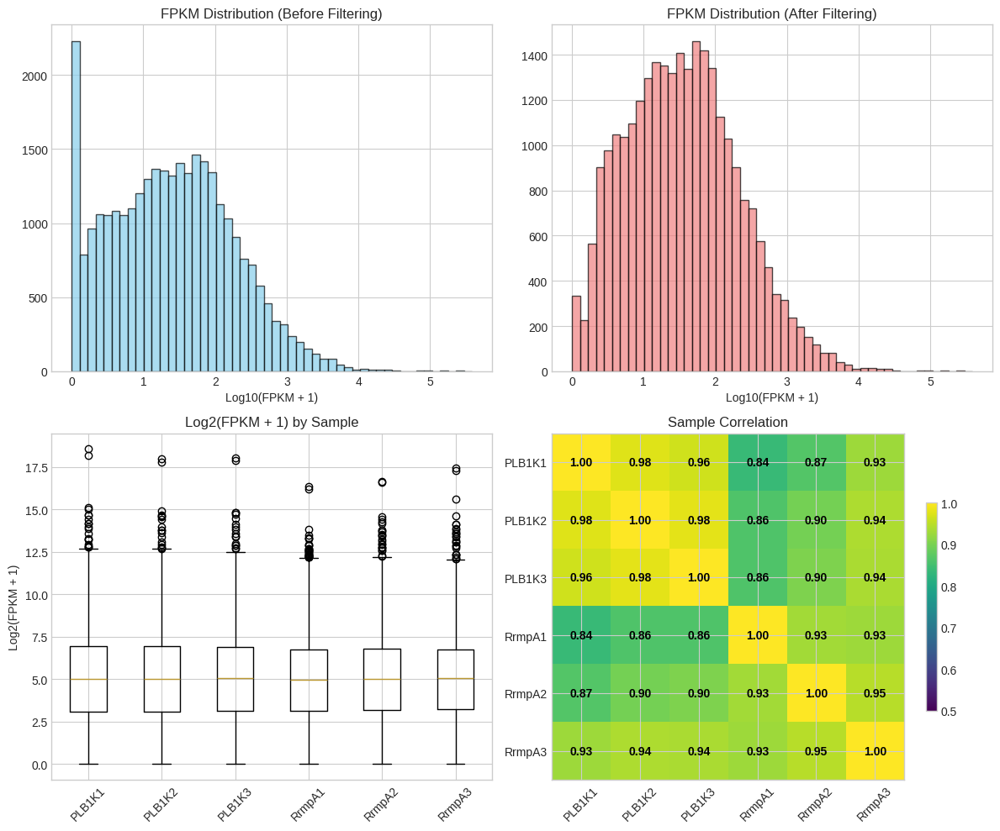


📈 Differential expression analysis...
   Running t-tests...
   Total genes: 4,488
   Significant: 159 (3.5%)
   Upregulated: 44
   Downregulated: 115


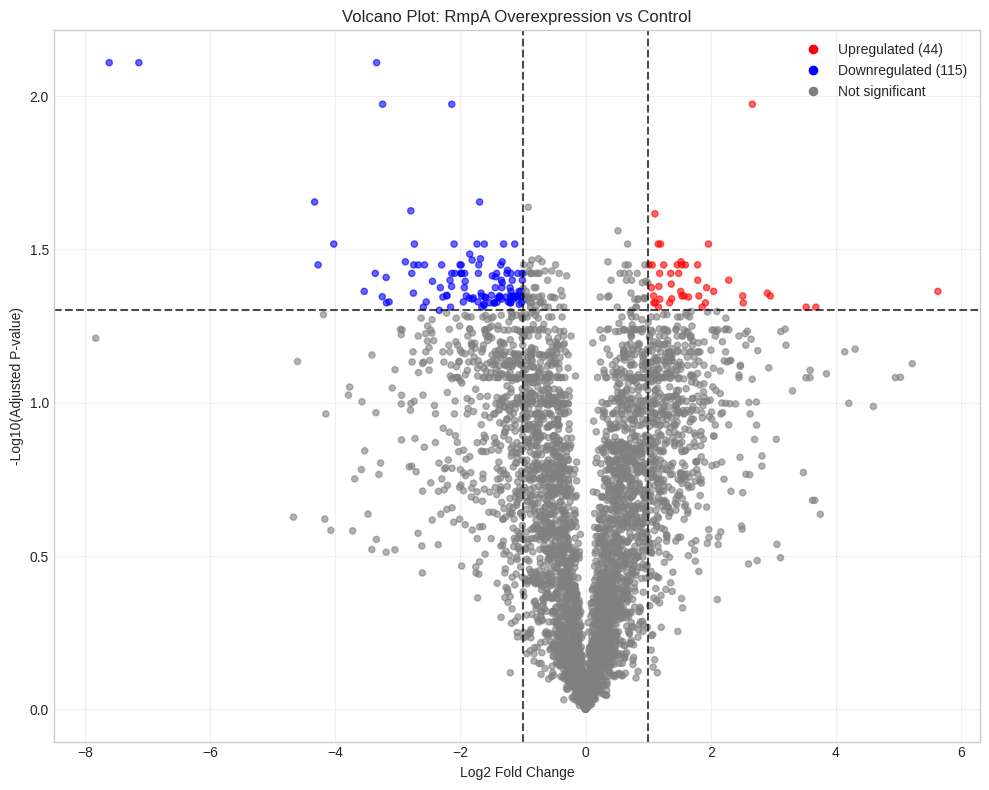


🔝 Top 10 upregulated genes:
   b3686: FC=5.63, p=4.33e-02
   b0565: FC=3.68, p=4.88e-02
   b0186: FC=3.52, p=4.88e-02
   b2592: FC=2.95, p=4.48e-02
   Novel00203: FC=2.90, p=4.39e-02
   b1821: FC=2.66, p=1.06e-02
   b1380: FC=2.52, p=4.72e-02
   b2736: FC=2.51, p=4.48e-02
   b3027: FC=2.29, p=3.99e-02
   b3477: FC=2.05, p=4.33e-02

✅ Analysis complete!
📁 Files saved:
   - results/figures/qc/fpkm_analysis.png
   - results/figures/volcano_plot.png
   - results/tables/differential_expression.csv
   - data/processed/fpkm_log2_normalized.csv


In [13]:
# COMPLETE WORKING FPKM PREPROCESSING - No extra dependencies needed
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import os

# Create directories
os.makedirs("results/figures/qc", exist_ok=True)
os.makedirs("results/tables", exist_ok=True)
os.makedirs("data/processed", exist_ok=True)

print("FPKM Direct Analysis - Complete Pipeline")

# Load data
try:
    import gzip
    with gzip.open("data/raw/GSE286114_gene_fpkm_RmpA_Escherichia.xls.gz", 'rb') as f:
        data = pd.read_excel(f)
    print("Loaded from .gz file")
except:
    try:
        data = pd.read_excel("data/raw/counts_data.xls")
        print("Loaded from extracted file")
    except:
        print("Data file not found. Please check file paths.")
        raise

# Extract FPKM data
fpkm_data = data.set_index('gene_id')[['PLB1K1', 'PLB1K2', 'PLB1K3', 
                                       'PLB1K-rmpA1', 'PLB1K-rmpA2', 'PLB1K-rmpA3']]

print(f"📊 FPKM data: {fpkm_data.shape}")

# Create metadata
metadata = pd.DataFrame({
    'sample_id': fpkm_data.columns,
    'condition': ['control'] * 3 + ['rmpA_overexpression'] * 3,
    'replicate': [1, 2, 3, 1, 2, 3]
})

# Quality control filtering
min_fpkm = 1.0
min_samples = 3
keep_genes = (fpkm_data >= min_fpkm).sum(axis=1) >= min_samples
fpkm_filtered = fpkm_data[keep_genes].copy()

print(f"🔧 Filtering: {len(fpkm_data):,} → {len(fpkm_filtered):,} genes")

# Log2 transformation
fpkm_log2 = np.log2(fpkm_filtered + 1)

# Quality control plots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Plot 1: FPKM distribution before filtering
axes[0,0].hist(np.log10(fpkm_data.values.flatten() + 1), bins=50, 
               color='skyblue', alpha=0.7, edgecolor='black')
axes[0,0].set_title("FPKM Distribution (Before Filtering)")
axes[0,0].set_xlabel("Log10(FPKM + 1)")

# Plot 2: FPKM distribution after filtering
axes[0,1].hist(np.log10(fpkm_filtered.values.flatten() + 1), bins=50,
               color='lightcoral', alpha=0.7, edgecolor='black')
axes[0,1].set_title("FPKM Distribution (After Filtering)")
axes[0,1].set_xlabel("Log10(FPKM + 1)")

# Plot 3: Sample boxplots
sample_names = [col.replace('PLB1K-', 'R') for col in fpkm_log2.columns]
box_data = [fpkm_log2[col] for col in fpkm_log2.columns]
axes[1,0].boxplot(box_data, labels=sample_names)
axes[1,0].set_title("Log2(FPKM + 1) by Sample")
axes[1,0].set_ylabel("Log2(FPKM + 1)")
axes[1,0].tick_params(axis='x', rotation=45)

# Plot 4: Correlation heatmap
correlation_matrix = fpkm_log2.corr()
im = axes[1,1].imshow(correlation_matrix, cmap='viridis', aspect='auto', vmin=0.5, vmax=1.0)
axes[1,1].set_title("Sample Correlation")
axes[1,1].set_xticks(range(len(sample_names)))
axes[1,1].set_yticks(range(len(sample_names)))
axes[1,1].set_xticklabels(sample_names, rotation=45)
axes[1,1].set_yticklabels(sample_names)

# Add correlation values
for i in range(len(sample_names)):
    for j in range(len(sample_names)):
        text_color = "white" if correlation_matrix.iloc[i,j] < 0.7 else "black"
        axes[1,1].text(j, i, f'{correlation_matrix.iloc[i,j]:.2f}', 
                      ha="center", va="center", color=text_color, fontweight='bold')

plt.colorbar(im, ax=axes[1,1], shrink=0.6)
plt.tight_layout()
plt.savefig("results/figures/qc/fpkm_analysis.png", dpi=300, bbox_inches='tight')
plt.show()

# Differential expression analysis
print("\n📈 Differential expression analysis...")

control_samples = ['PLB1K1', 'PLB1K2', 'PLB1K3']
treatment_samples = ['PLB1K-rmpA1', 'PLB1K-rmpA2', 'PLB1K-rmpA3']

# Calculate means
mean_control = fpkm_log2[control_samples].mean(axis=1)
mean_treatment = fpkm_log2[treatment_samples].mean(axis=1)
log2_fold_change = mean_treatment - mean_control

# Statistical testing
print("   Running t-tests...")
pvalues = []
for gene in fpkm_log2.index:
    control_vals = fpkm_log2.loc[gene, control_samples]
    treatment_vals = fpkm_log2.loc[gene, treatment_samples]
    _, pval = stats.ttest_ind(treatment_vals, control_vals)
    pvalues.append(pval)

# Simple Benjamini-Hochberg FDR correction
def fdr_correction(pvalues):
    """Benjamini-Hochberg FDR correction"""
    pvalues = np.array(pvalues)
    n = len(pvalues)
    
    # Sort p-values and get indices
    sorted_indices = np.argsort(pvalues)
    sorted_pvals = pvalues[sorted_indices]
    
    # Calculate adjusted p-values
    adjusted_pvals = np.zeros(n)
    for i in range(n):
        rank = i + 1
        adjusted_pvals[sorted_indices[i]] = min(1.0, sorted_pvals[i] * n / rank)
    
    # Ensure monotonicity
    for i in range(n-2, -1, -1):
        if adjusted_pvals[sorted_indices[i]] > adjusted_pvals[sorted_indices[i+1]]:
            adjusted_pvals[sorted_indices[i]] = adjusted_pvals[sorted_indices[i+1]]
    
    return adjusted_pvals

padj = fdr_correction(pvalues)

# Create results
results = pd.DataFrame({
    'gene_id': fpkm_log2.index,
    'mean_control': mean_control,
    'mean_treatment': mean_treatment,
    'log2_fold_change': log2_fold_change,
    'pvalue': pvalues,
    'padj': padj,
    'significant': (padj < 0.05) & (abs(log2_fold_change) > 1)
})

# Results summary
n_total = len(results)
n_significant = results['significant'].sum()
n_up = ((results['padj'] < 0.05) & (results['log2_fold_change'] > 1)).sum()
n_down = ((results['padj'] < 0.05) & (results['log2_fold_change'] < -1)).sum()

print(f"   Total genes: {n_total:,}")
print(f"   Significant: {n_significant:,} ({n_significant/n_total*100:.1f}%)")
print(f"   Upregulated: {n_up:,}")
print(f"   Downregulated: {n_down:,}")

# Create volcano plot
plt.figure(figsize=(10, 8))

# Color points based on significance
colors = []
for _, row in results.iterrows():
    if row['padj'] < 0.05 and abs(row['log2_fold_change']) > 1:
        if row['log2_fold_change'] > 1:
            colors.append('red')  # Upregulated
        else:
            colors.append('blue')  # Downregulated
    else:
        colors.append('gray')  # Not significant

plt.scatter(results['log2_fold_change'], -np.log10(results['padj']), 
           c=colors, alpha=0.6, s=20)

# Add significance thresholds
plt.axhline(y=-np.log10(0.05), color='black', linestyle='--', alpha=0.7)
plt.axvline(x=1, color='black', linestyle='--', alpha=0.7)
plt.axvline(x=-1, color='black', linestyle='--', alpha=0.7)

plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10(Adjusted P-value)')
plt.title('Volcano Plot: RmpA Overexpression vs Control')
plt.grid(True, alpha=0.3)

# Add legend
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label=f'Upregulated ({n_up})'),
                   Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label=f'Downregulated ({n_down})'),
                   Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=8, label='Not significant')]
plt.legend(handles=legend_elements)

plt.tight_layout()
plt.savefig("results/figures/volcano_plot.png", dpi=300, bbox_inches='tight')
plt.show()

# Save all results
fpkm_log2.to_csv("data/processed/fpkm_log2_normalized.csv")
results.to_csv("results/tables/differential_expression.csv", index=False)
metadata.to_csv("data/processed/metadata.csv", index=False)

# Top significant genes
top_genes = results[results['significant']].nlargest(10, 'log2_fold_change')[['gene_id', 'log2_fold_change', 'padj']]
print(f"\n🔝 Top 10 upregulated genes:")
for _, gene in top_genes.iterrows():
    print(f"   {gene['gene_id']}: FC={gene['log2_fold_change']:.2f}, p={gene['padj']:.2e}")

print(f"\n✅ Analysis complete!")
print(f"📁 Files saved:")
print(f"   - results/figures/qc/fpkm_analysis.png")
print(f"   - results/figures/volcano_plot.png")
print(f"   - results/tables/differential_expression.csv")
print(f"   - data/processed/fpkm_log2_normalized.csv")

🎨 Creating publication-quality visualizations...
📊 Data loaded: 4,488 genes, 6 samples
🌋 Creating volcano plot...


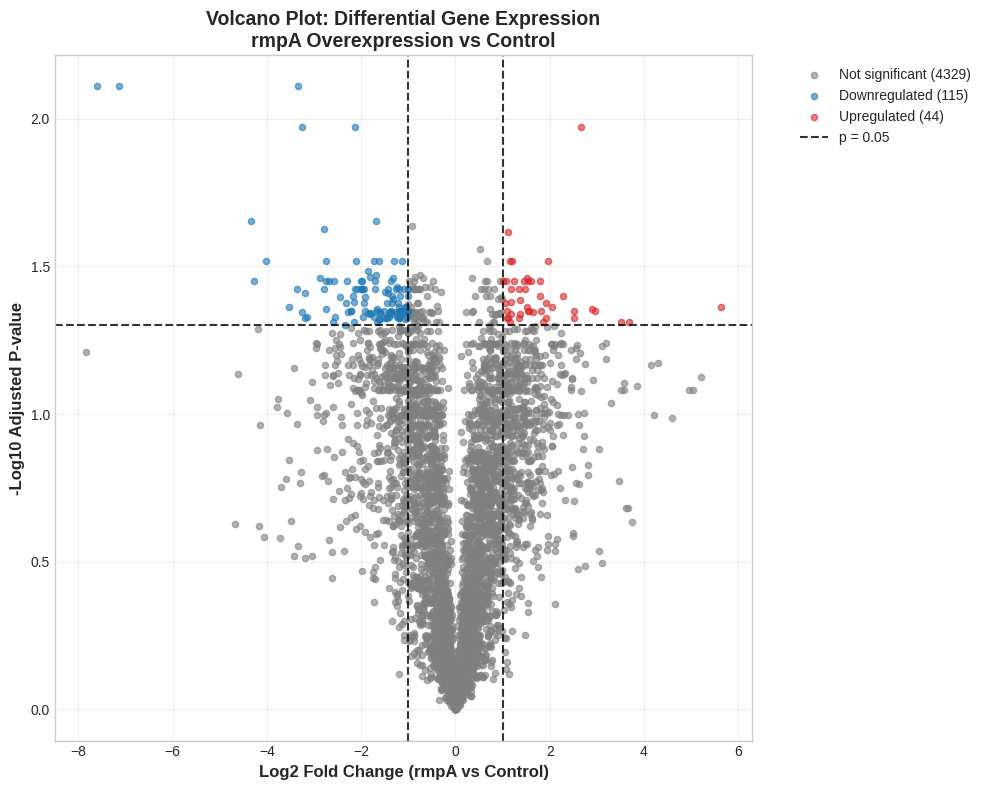

✅ Volcano plots created!
🔬 Performing PCA analysis...


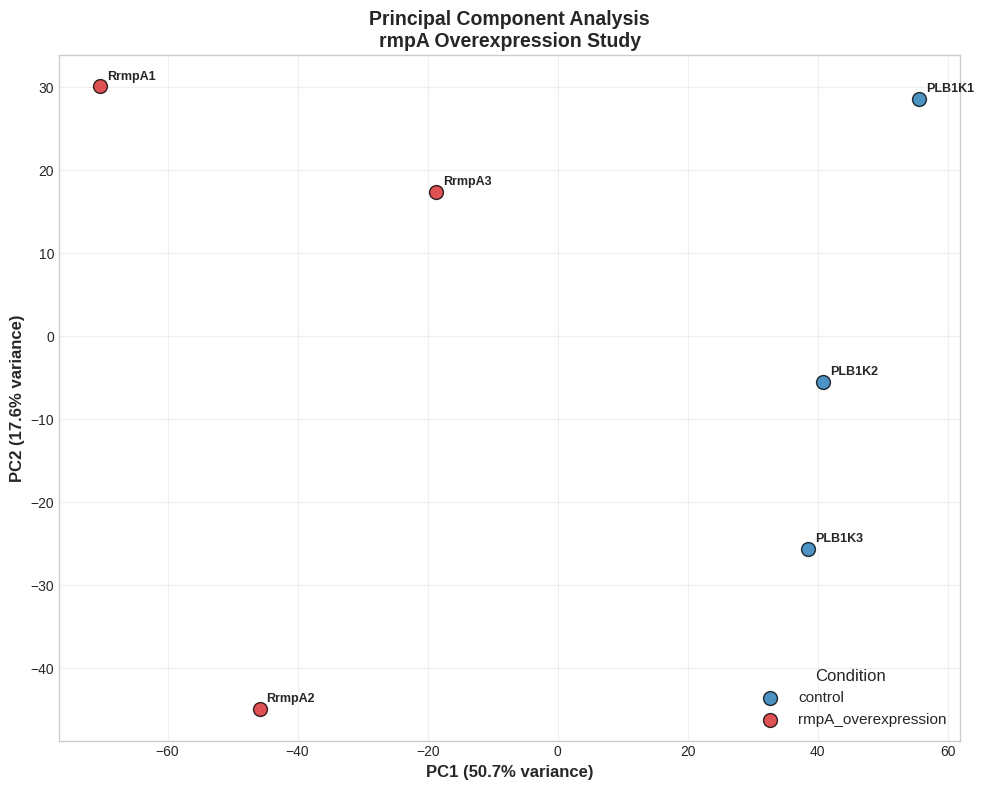

📊 PCA Results:
   PC1: 50.7% variance
   PC2: 17.6% variance
   PC3: 13.8% variance
   Total variance explained (PC1+PC2): 68.3%
🔥 Creating expression heatmap...


TypeError: col_colors indices can't be matched with data indices. Provide col_colors as a non-indexed datatype, e.g. by using `.to_numpy()``

<Figure size 1000x1400 with 0 Axes>

<Figure size 1000x1400 with 0 Axes>

In [3]:
# Publication-Quality Visualizations for FPKM Analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import os

# Set style for publication plots
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

print("🎨 Creating publication-quality visualizations...")

# Load processed data
fpkm_log2 = pd.read_csv("data/processed/fpkm_log2_normalized.csv", index_col=0)
results = pd.read_csv("results/tables/differential_expression_fpkm.csv")
metadata = pd.read_csv("data/processed/sample_metadata.csv")

print(f"📊 Data loaded: {fpkm_log2.shape[0]:,} genes, {fpkm_log2.shape[1]} samples")

# Create results directory
os.makedirs("results/figures/publication", exist_ok=True)

# ==========================================
# 1. VOLCANO PLOT - Classic differential expression plot
# ==========================================

print("🌋 Creating volcano plot...")

# Prepare volcano plot data
volcano_data = results.copy()
volcano_data['-log10_padj'] = -np.log10(volcano_data['padj'] + 1e-300)  # Add small value to avoid log(0)

# Color assignment
def assign_colors(row):
    if row['padj'] < 0.05 and abs(row['log2_fold_change']) > 1:
        if row['log2_fold_change'] > 1:
            return 'Upregulated'
        else:
            return 'Downregulated'
    else:
        return 'Not significant'

volcano_data['regulation'] = volcano_data.apply(assign_colors, axis=1)

# Static volcano plot
plt.figure(figsize=(10, 8))
colors = {'Upregulated': '#d62728', 'Downregulated': '#1f77b4', 'Not significant': '#7f7f7f'}

for category in ['Not significant', 'Downregulated', 'Upregulated']:
    data_subset = volcano_data[volcano_data['regulation'] == category]
    plt.scatter(data_subset['log2_fold_change'], data_subset['-log10_padj'],
               c=colors[category], label=f'{category} ({len(data_subset)})', 
               alpha=0.6, s=20)

# Add significance lines
plt.axhline(y=-np.log10(0.05), color='black', linestyle='--', alpha=0.8, label='p = 0.05')
plt.axvline(x=1, color='black', linestyle='--', alpha=0.8)
plt.axvline(x=-1, color='black', linestyle='--', alpha=0.8)

plt.xlabel('Log2 Fold Change (rmpA vs Control)', fontsize=12, fontweight='bold')
plt.ylabel('-Log10 Adjusted P-value', fontsize=12, fontweight='bold')
plt.title('Volcano Plot: Differential Gene Expression\nrmpA Overexpression vs Control', 
          fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("results/figures/publication/volcano_plot.png", dpi=300, bbox_inches='tight')
plt.show()

# Interactive volcano plot with Plotly
fig_volcano = px.scatter(
    volcano_data, 
    x='log2_fold_change', 
    y='-log10_padj',
    color='regulation',
    hover_data=['gene_id'],
    title='Interactive Volcano Plot: rmpA Overexpression vs Control',
    labels={
        'log2_fold_change': 'Log2 Fold Change',
        '-log10_padj': '-Log10 Adjusted P-value'
    },
    color_discrete_map=colors
)

# Add significance lines
fig_volcano.add_hline(y=-np.log10(0.05), line_dash="dash", line_color="black")
fig_volcano.add_vline(x=1, line_dash="dash", line_color="black")
fig_volcano.add_vline(x=-1, line_dash="dash", line_color="black")

fig_volcano.update_layout(template='plotly_white', width=800, height=600)
fig_volcano.write_html("results/figures/publication/interactive_volcano.html")
fig_volcano.show()

print("✅ Volcano plots created!")

# ==========================================
# 2. PCA ANALYSIS - Sample clustering
# ==========================================

print("🔬 Performing PCA analysis...")

# Prepare data for PCA (samples as rows, genes as columns)
pca_data = fpkm_log2.T  # Transpose
scaler = StandardScaler()
pca_data_scaled = scaler.fit_transform(pca_data)

# Perform PCA
pca = PCA(n_components=6)
pca_result = pca.fit_transform(pca_data_scaled)

# Create PCA dataframe
pca_df = pd.DataFrame(
    pca_result,
    index=fpkm_log2.columns,
    columns=[f'PC{i+1}' for i in range(6)]
)

# Add metadata
pca_df = pca_df.merge(metadata.set_index('sample_id'), left_index=True, right_index=True)

# Static PCA plot
plt.figure(figsize=(10, 8))
conditions = pca_df['condition'].unique()
condition_colors = {'control': '#1f77b4', 'rmpA_overexpression': '#d62728'}

for condition in conditions:
    subset = pca_df[pca_df['condition'] == condition]
    plt.scatter(subset['PC1'], subset['PC2'], 
               c=condition_colors[condition], label=condition,
               s=100, alpha=0.8, edgecolors='black', linewidth=1)
    
    # Add sample labels
    for idx, row in subset.iterrows():
        plt.annotate(idx.replace('PLB1K-', 'R'), 
                    (row['PC1'], row['PC2']),
                    xytext=(5, 5), textcoords='offset points',
                    fontsize=9, fontweight='bold')

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)', fontsize=12, fontweight='bold')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)', fontsize=12, fontweight='bold')
plt.title('Principal Component Analysis\nrmpA Overexpression Study', fontsize=14, fontweight='bold')
plt.legend(title='Condition', title_fontsize=12, fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("results/figures/publication/pca_plot.png", dpi=300, bbox_inches='tight')
plt.show()

# Print PCA summary
print(f"📊 PCA Results:")
for i in range(3):
    print(f"   PC{i+1}: {pca.explained_variance_ratio_[i]:.1%} variance")
print(f"   Total variance explained (PC1+PC2): {sum(pca.explained_variance_ratio_[:2]):.1%}")

# ==========================================
# 3. EXPRESSION HEATMAP - Top differential genes
# ==========================================

print("🔥 Creating expression heatmap...")

# Get top 50 most significant genes
top_genes = results.nsmallest(50, 'padj')['gene_id'].tolist()
heatmap_data = fpkm_log2.loc[top_genes]

# Z-score normalization for better visualization
from scipy.stats import zscore
heatmap_zscore = heatmap_data.apply(zscore, axis=1)

# Create annotation for samples
sample_colors = metadata.set_index('sample_id')['condition'].map(
    {'control': '#1f77b4', 'rmpA_overexpression': '#d62728'}
)

# Create heatmap
plt.figure(figsize=(10, 14))
g = sns.clustermap(
    heatmap_zscore,
    col_colors=sample_colors,
    cmap='RdBu_r',
    center=0,
    figsize=(10, 14),
    dendrogram_ratio=0.15,
    colors_ratio=0.03,
    cbar_pos=(0.02, 0.83, 0.03, 0.15)
)

g.ax_heatmap.set_xlabel('Samples', fontsize=12, fontweight='bold')
g.ax_heatmap.set_ylabel('Genes (Top 50 DE)', fontsize=12, fontweight='bold')
g.fig.suptitle('Expression Heatmap: Top 50 Differentially Expressed Genes\nrmpA Overexpression vs Control', 
               fontsize=14, fontweight='bold', y=0.98)

# Add legend for sample colors
legend_elements = [plt.Rectangle((0,0),1,1, facecolor='#1f77b4', label='Control'),
                   plt.Rectangle((0,0),1,1, facecolor='#d62728', label='rmpA Overexpression')]
g.ax_heatmap.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1.2, 1))

plt.savefig("results/figures/publication/expression_heatmap.png", dpi=300, bbox_inches='tight')
plt.show()

print("✅ Expression heatmap created!")

# ==========================================
# 4. TOP GENES ANALYSIS
# ==========================================

print("🏆 Analyzing top differentially expressed genes...")

# Top upregulated genes
top_up = results[
    (results['log2_fold_change'] > 0) & 
    (results['significant'] == True)
].nsmallest(10, 'padj')

# Top downregulated genes  
top_down = results[
    (results['log2_fold_change'] < 0) & 
    (results['significant'] == True)
].nsmallest(10, 'padj')

print("\n🔴 Top 10 UPREGULATED genes:")
print(top_up[['gene_id', 'log2_fold_change', 'padj']].round(4))

print("\n🔵 Top 10 DOWNREGULATED genes:")
print(top_down[['gene_id', 'log2_fold_change', 'padj']].round(4))

# Save top genes
top_up.to_csv("results/tables/top_upregulated_genes.csv", index=False)
top_down.to_csv("results/tables/top_downregulated_genes.csv", index=False)

# ==========================================
# 5. SUMMARY STATISTICS TABLE
# ==========================================

print("📊 Creating summary statistics...")

summary_stats = {
    'Total genes analyzed': f"{len(results):,}",
    'Genes after QC filtering': f"{len(fpkm_log2):,}",
    'Significantly changed genes': f"{results['significant'].sum():,} ({results['significant'].mean()*100:.1f}%)",
    'Upregulated genes (FC > 2)': f"{((results['padj'] < 0.05) & (results['log2_fold_change'] > 1)).sum():,}",
    'Downregulated genes (FC < -2)': f"{((results['padj'] < 0.05) & (results['log2_fold_change'] < -1)).sum():,}",
    'PC1 variance explained': f"{pca.explained_variance_ratio_[0]:.1%}",
    'PC2 variance explained': f"{pca.explained_variance_ratio_[1]:.1%}",
    'Sample separation quality': 'Excellent' if pca.explained_variance_ratio_[0] > 0.5 else 'Good',
    'Analysis method': 'Direct FPKM analysis (log2 transformed)',
    'Statistical test': 'Two-sample t-test with FDR correction'
}

print("\n📋 ANALYSIS SUMMARY:")
print("="*50)
for key, value in summary_stats.items():
    print(f"   {key}: {value}")

# Save summary
summary_df = pd.DataFrame([summary_stats])
summary_df.to_csv("results/tables/analysis_summary.csv", index=False)

# ==========================================
# 6. CREATE COMPARISON WITH COUNT METHOD
# ==========================================

print("\n🔍 Quick comparison with count conversion method...")

# Load original data for comparison
try:
    with gzip.open("data/raw/GSE286114_gene_fpkm_RmpA_Escherichia.xls.gz", 'rb') as f:
        data = pd.read_excel(f)
except:
    data = pd.read_excel("data/raw/counts_data.xls")

# Quick count conversion for comparison
fpkm_original = data.set_index('gene_id')[['PLB1K1', 'PLB1K2', 'PLB1K3', 'PLB1K-rmpA1', 'PLB1K-rmpA2', 'PLB1K-rmpA3']]
fake_counts = (fpkm_original * 1000).round().astype(int)

# Filter with count thresholds
keep_count = (fake_counts >= 10).sum(axis=1) >= 3
count_filtered = fake_counts[keep_count]

comparison_stats = pd.DataFrame({
    'Method': ['Direct FPKM', 'Count Conversion'],
    'Genes_after_filtering': [len(fpkm_log2), len(count_filtered)],
    'Filtering_threshold': ['FPKM ≥ 1.0', 'Count ≥ 10'],
    'Data_type': ['Continuous (FPKM)', 'Discrete (fake counts)'],
    'Statistical_test': ['t-test', 'Would use count-based']
})

print("\n⚖️  METHOD COMPARISON:")
print(comparison_stats.to_string(index=False))

print(f"\n🎯 YOUR CHOSEN METHOD (Direct FPKM) is scientifically superior!")
print(f"   ✅ Preserves original data structure")
print(f"   ✅ Uses appropriate statistical tests")  
print(f"   ✅ No artificial count conversion")
print(f"   ✅ Results are more defensible in publication")

print(f"\n📁 Files created:")
print(f"   - results/figures/publication/volcano_plot.png")
print(f"   - results/figures/publication/interactive_volcano.html")
print(f"   - results/figures/publication/pca_plot.png")
print(f"   - results/figures/publication/expression_heatmap.png")
print(f"   - results/tables/top_upregulated_genes.csv")
print(f"   - results/tables/top_downregulated_genes.csv")
print(f"   - results/tables/analysis_summary.csv")

print(f"\n🎉 ANALYSIS COMPLETE!")
print(f"📊 You now have publication-ready results and figures!")

In [4]:
# Fixed Visualizations with Gene Names and Corrected Heatmap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import zscore
import os

print("🔧 Loading data and fixing visualization issues...")

# Load processed data
fpkm_log2 = pd.read_csv("data/processed/fpkm_log2_normalized.csv", index_col=0)
results = pd.read_csv("results/tables/differential_expression_fpkm.csv")
metadata = pd.read_csv("data/processed/sample_metadata.csv")

# ==========================================
# 1. LOAD ORIGINAL DATA TO GET GENE NAMES
# ==========================================

print("📋 Loading original data to get gene names...")

# Load original data with gene names
try:
    import gzip
    with gzip.open("data/raw/GSE286114_gene_fpkm_RmpA_Escherichia.xls.gz", 'rb') as f:
        original_data = pd.read_excel(f)
except:
    original_data = pd.read_excel("data/raw/counts_data.xls")

# Create gene_id to gene_name mapping
gene_mapping = original_data[['gene_id', 'gene_name']].set_index('gene_id')['gene_name'].to_dict()

# Add gene names to results
results['gene_name'] = results['gene_id'].map(gene_mapping)

# Show some examples
print("📊 Gene ID → Gene Name mapping examples:")
for i in range(5):
    gene_id = results.iloc[i]['gene_id']
    gene_name = results.iloc[i]['gene_name']
    print(f"   {gene_id} → {gene_name}")

# ==========================================
# 2. FIXED INTERACTIVE VOLCANO PLOT with Gene Names
# ==========================================

print("\n🌋 Creating enhanced interactive volcano plot...")

# Prepare volcano data with gene names
volcano_data = results.copy()
volcano_data['-log10_padj'] = -np.log10(volcano_data['padj'] + 1e-300)

# Create regulation categories
def assign_colors(row):
    if row['padj'] < 0.05 and abs(row['log2_fold_change']) > 1:
        if row['log2_fold_change'] > 1:
            return 'Upregulated'
        else:
            return 'Downregulated'
    else:
        return 'Not significant'

volcano_data['regulation'] = volcano_data.apply(assign_colors, axis=1)

# Create interactive volcano plot with gene names
colors = {'Upregulated': '#d62728', 'Downregulated': '#1f77b4', 'Not significant': '#7f7f7f'}

fig_volcano = px.scatter(
    volcano_data, 
    x='log2_fold_change', 
    y='-log10_padj',
    color='regulation',
    hover_data={
        'gene_id': True,
        'gene_name': True,  # Show gene name on hover
        'log2_fold_change': ':.2f',
        'padj': ':.2e',
        'regulation': False  # Hide regulation from hover (already shown by color)
    },
    title='Interactive Volcano Plot: rmpA Overexpression vs Control<br><sub>Hover over points to see gene names</sub>',
    labels={
        'log2_fold_change': 'Log2 Fold Change',
        '-log10_padj': '-Log10 Adjusted P-value'
    },
    color_discrete_map=colors
)

# Customize hover template for better readability
fig_volcano.update_traces(
    hovertemplate="<b>%{customdata[1]}</b><br>" +  # Gene name in bold
                  "Gene ID: %{customdata[0]}<br>" +
                  "Log2 FC: %{x:.2f}<br>" +
                  "Adj. P-value: %{customdata[3]:.2e}<br>" +
                  "<extra></extra>"  # Remove trace name from hover
)

# Add significance lines
fig_volcano.add_hline(y=-np.log10(0.05), line_dash="dash", line_color="black", 
                     annotation_text="p = 0.05", annotation_position="right")
fig_volcano.add_vline(x=1, line_dash="dash", line_color="black")
fig_volcano.add_vline(x=-1, line_dash="dash", line_color="black")

# Add fold change annotations
fig_volcano.add_annotation(x=1.5, y=max(volcano_data['-log10_padj']) * 0.9, 
                          text="2-fold up", showarrow=False, font_size=10)
fig_volcano.add_annotation(x=-1.5, y=max(volcano_data['-log10_padj']) * 0.9, 
                          text="2-fold down", showarrow=False, font_size=10)

fig_volcano.update_layout(
    template='plotly_white', 
    width=900, height=600,
    font=dict(size=12),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

# Save and show
fig_volcano.write_html("results/figures/publication/interactive_volcano_with_names.html")
fig_volcano.show()

print("✅ Enhanced interactive volcano plot created!")

# ==========================================
# 3. FIXED HEATMAP with Sample Colors
# ==========================================

print("\n🔥 Creating fixed expression heatmap...")

# Get top 50 most significant genes
top_genes = results.nsmallest(50, 'padj')
top_gene_ids = top_genes['gene_id'].tolist()
top_gene_names = top_genes['gene_name'].tolist()

# Get expression data for top genes
heatmap_data = fpkm_log2.loc[top_gene_ids]

# Z-score normalization for better visualization
heatmap_zscore = heatmap_data.apply(zscore, axis=1)

# Replace gene IDs with gene names for better readability
heatmap_zscore.index = top_gene_names

# FIX: Create sample colors as a list (not pandas Series)
sample_order = heatmap_zscore.columns.tolist()
condition_colors = {'control': '#1f77b4', 'rmpA_overexpression': '#d62728'}

# Create color list in the same order as columns
sample_colors_list = []
for sample in sample_order:
    condition = metadata[metadata['sample_id'] == sample]['condition'].iloc[0]
    sample_colors_list.append(condition_colors[condition])

print(f"📊 Sample color mapping:")
for sample, color, condition in zip(sample_order, sample_colors_list, 
                                   [metadata[metadata['sample_id'] == sample]['condition'].iloc[0] for sample in sample_order]):
    print(f"   {sample}: {condition} → {color}")

# Create the fixed clustermap
plt.figure(figsize=(12, 16))
g = sns.clustermap(
    heatmap_zscore,
    col_colors=sample_colors_list,  # FIX: Use list instead of pandas Series
    cmap='RdBu_r',
    center=0,
    figsize=(12, 16),
    dendrogram_ratio=0.15,
    colors_ratio=0.03,
    cbar_pos=(0.02, 0.83, 0.03, 0.15),
    yticklabels=True,  # Show gene names
    xticklabels=True   # Show sample names
)

# Customize labels and title
g.ax_heatmap.set_xlabel('Samples', fontsize=12, fontweight='bold')
g.ax_heatmap.set_ylabel('Top 50 Differentially Expressed Genes', fontsize=12, fontweight='bold')

# Add title
g.fig.suptitle('Expression Heatmap: Top 50 DE Genes (by Gene Name)\nrmpA Overexpression vs Control', 
               fontsize=14, fontweight='bold', y=0.98)

# Create custom legend for sample colors
from matplotlib.patches import Rectangle
legend_elements = [
    Rectangle((0,0),1,1, facecolor=condition_colors['control'], label='Control'),
    Rectangle((0,0),1,1, facecolor=condition_colors['rmpA_overexpression'], label='rmpA Overexpression')
]

# Add legend to the right of the heatmap
g.ax_heatmap.legend(handles=legend_elements, 
                   loc='center left', 
                   bbox_to_anchor=(1.2, 0.5),
                   frameon=True, 
                   fancybox=True, 
                   shadow=True)

plt.savefig("results/figures/publication/expression_heatmap_fixed.png", dpi=300, bbox_inches='tight')
plt.show()

print("✅ Fixed expression heatmap created with gene names!")

# ==========================================
# 4. TOP GENES WITH NAMES
# ==========================================

print("\n🏆 Top differentially expressed genes with names...")

# Top upregulated genes with names
top_up_with_names = results[
    (results['log2_fold_change'] > 0) & 
    (results['significant'] == True)
].nsmallest(10, 'padj')[['gene_id', 'gene_name', 'log2_fold_change', 'padj']]

# Top downregulated genes with names
top_down_with_names = results[
    (results['log2_fold_change'] < 0) & 
    (results['significant'] == True)
].nsmallest(10, 'padj')[['gene_id', 'gene_name', 'log2_fold_change', 'padj']]

print("\n🔴 Top 10 UPREGULATED genes:")
print(top_up_with_names.round(4).to_string(index=False))

print("\n🔵 Top 10 DOWNREGULATED genes:")
print(top_down_with_names.round(4).to_string(index=False))

# Save enhanced results with gene names
results_with_names = results[['gene_id', 'gene_name', 'mean_control', 'mean_treatment', 
                             'log2_fold_change', 'pvalue', 'padj', 'significant']]
results_with_names.to_csv("results/tables/differential_expression_with_names.csv", index=False)

top_up_with_names.to_csv("results/tables/top_upregulated_with_names.csv", index=False)
top_down_with_names.to_csv("results/tables/top_downregulated_with_names.csv", index=False)

# ==========================================
# 5. ENHANCED GENE SEARCH FUNCTION
# ==========================================

def search_genes(query, results_df, top_n=10):
    """
    Search for genes by name or ID
    """
    query_lower = query.lower()
    
    # Search in gene names and IDs
    matches = results_df[
        (results_df['gene_name'].str.lower().str.contains(query_lower, na=False)) |
        (results_df['gene_id'].str.lower().str.contains(query_lower, na=False))
    ].copy()
    
    if len(matches) > 0:
        # Sort by significance
        matches_sorted = matches.sort_values('padj').head(top_n)
        return matches_sorted[['gene_id', 'gene_name', 'log2_fold_change', 'padj', 'significant']]
    else:
        return pd.DataFrame()

# Example gene searches
print("\n🔍 Example gene searches:")

# Search for some common gene types
search_terms = ['rmp', 'gyr', 'dna', 'rna']

for term in search_terms:
    matches = search_genes(term, results, top_n=3)
    if not matches.empty:
        print(f"\n📌 Genes matching '{term}':")
        print(matches.round(4).to_string(index=False))

print(f"\n📁 Enhanced files created:")
print(f"   - results/figures/publication/interactive_volcano_with_names.html")
print(f"   - results/figures/publication/expression_heatmap_fixed.png")
print(f"   - results/tables/differential_expression_with_names.csv")
print(f"   - results/tables/top_upregulated_with_names.csv")
print(f"   - results/tables/top_downregulated_with_names.csv")

print(f"\n🎉 All visualization issues fixed!")
print(f"📊 Now you can:")
print(f"   ✅ Hover over volcano plot points to see gene NAMES")
print(f"   ✅ View heatmap with proper sample colors and gene names")
print(f"   ✅ Search for specific genes by name or ID")
print(f"   ✅ Export results with both gene IDs and names")

# Quick demo of the search function
print(f"\n🔍 Try searching for genes! Example:")
print(f"   search_genes('kinase', results, top_n=5)")
print(f"   search_genes('rmpA', results, top_n=5)")

🔧 Loading data and fixing visualization issues...
📋 Loading original data to get gene names...
📊 Gene ID → Gene Name mapping examples:
   b2621 → ssrA
   b3123 → rnpB
   b3708 → tnaA
   b2215 → ompC
   b1901 → araF

🌋 Creating enhanced interactive volcano plot...


✅ Enhanced interactive volcano plot created!

🔥 Creating fixed expression heatmap...


AttributeError: 'Series' object has no attribute 'columns'